<a href="https://colab.research.google.com/github/rajanhans/SDS-CP024-neurovision/blob/main/BrainTumorDetectionYolo1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Install the packages per the requirements.txt found in YOLO git location**

In [1]:
#!pip install -q git+https://github.com/THU-MIG/yolov10.git
!pip install -q git+https://github.com/ultralytics/ultralytics

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 110.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 84.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 49.1 MB/s eta 0:00:00


In [2]:
!pip install -U ultralytics

**No need to download dataset from roboflow as it is already downloaded on  the drive**

In [ ]:
#No need to download the dataset as it is saved in the drive. If you do not have it locally then uncomment the below to get it from roboflow
#!pip install -q roboflow
# Link to the dataset --> https://universe.roboflow.com/brain-mri/mri-rskcu/dataset/3

In [ ]:
#No need to download the YoloV10 model as it is saved in the drive. If you do not have it locally then uncomment the below to get it from github
#!wget -P -q https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10n.pt

In [ ]:
#No need to download the dataset as it is saved in the drive. If you do not have it locally then uncomment the below to get it from roboflow
#!pip install -q roboflow

#from roboflow import Roboflow
#rf = Roboflow(api_key = "<Your Key>")
#project = rf.workspace("brain-mri").project("mri-rskcu")
#version = project.version(3)
#dataset = version.download("yolov8")

**Mount the google drive with dataset and the Yolo .pt (pytorch) model**

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [19]:
import os

# Specify the path to your Google Drive and Dataset folder
drive_folder = '/content/drive/MyDrive/SDS/NeuroVision'
dataset_folder = drive_folder +'/dataset'
# List the contents of the folders
print("Path to my Folder:", os.listdir("/content/drive/MyDrive/"))
print()
print("Drive Folder contents: ", os.listdir(drive_folder) )
print()
print("Dataset Folder contents: ", os.listdir(dataset_folder) )

Path to my Folder: ['MachineLearning', 'Google AI Studio', 'chroma_db', 'SDS', 'Pics', 'ColabNotebooks']

Drive Folder contents:  ['yolov10n.pt', 'dataset', 'BrainTumorDetectionYolo1.ipynb']

Dataset Folder contents:  ['README.roboflow.txt', 'README.dataset.txt', 'train', 'valid', 'data.yaml']


**The below command runs a YOLO training process (transfer learning) on the MRI Brain tumor images, with following params:**
*   ***!yolo:*** execute a shell command to call the YOLO command-line tool.
*   ***task=detect:*** set the task to object detection.
*   ***mode=train:*** start YOLO in training mode.
*   ***epochs=xx:*** The model will be trained for xx complete passes through the dataset.
*   ***batch=yy:*** Each training iteration will process yy images at a time.
*   ***plots=True:*** This enables the generation of training plots, which can help monitor progress and performance.
*   ***model= drive_folder + '/yolov10n.pt':*** Specify the path to the pre-trained model (YOLOv10n). The code will load weights from this model as a starting point.
*  ***data= dataset_folder + '/data.yaml':*** Specify the YAML configuration file that contains details about the dataset, such as paths to the images, class names, and other relevant settings.


In [23]:
model_folder = drive_folder + '/yolov10n.pt'
train_data_path = dataset_folder + '/data.yaml'  #train: /content/drive/MyDrive/SDS/NeuroVision/dataset/train/images
!yolo task=detect mode=train epochs=20 batch=32 plots=True  model= {model_folder} data= {train_data_path}


Ultralytics 8.3.101 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/SDS/NeuroVision/yolov10n.pt, data=/content/drive/MyDrive/SDS/NeuroVision/dataset/data.yaml, epochs=20, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_co

Loss Components:

box_loss: This is the loss associated with predicting the bounding box coordinates. Lower values indicate that the model is learning to better localize objects.

cls_loss: This represents the classification loss, which is related to correctly classifying objects.

dfl_loss: Stands for "distribution focal loss", a component in some YOLO architectures that helps with bounding box regression accuracy.

In your output, these losses decrease from epoch 1 to epoch 2 (e.g., box_loss from 3.167 to 2.857), suggesting that your model is learning and refining its predictions as training progresses.


mAP Scores:

mAP50: Mean Average Precision at an Intersection over Union (IoU) threshold of 0.5. It’s 0.189 in epoch 1 and 0.114 in epoch 2.

mAP50-95: Mean Average Precision averaged over multiple IoU thresholds (from 0.5 to 0.95). It’s 0.108 in epoch 1 and 0.0444 in epoch 2.

These mAP values provide a consolidated measure of detection performance. They might be lower in early epochs as the model is still learning, and you typically expect them to improve over time with further training.

---------------------------------------------------------------------------
**Load the best trained model (best.pt) and run it on the images in the validation set**



In [25]:
#This line of code imports the YOLO class from the ultralytics package and gives access to the functionalities
#provided by the Ultralytics implementation of the YOLO (You Only Look Once) object detection model
from ultralytics import YOLO #

model_path = "/content/runs/detect/train/weights/best.pt"
model = YOLO(model_path)

result = model(source = "/content/drive/MyDrive/SDS/NeuroVision/dataset/valid/images", conf = 0.25, save=True)

#Results are saved to runs/detect/predict


image 1/151 /content/drive/MyDrive/SDS/NeuroVision/dataset/valid/images/Tr-glTr_0000_jpg.rf.ee4ad3ca5d0eafd1f482988b89457634.jpg: 640x640 (no detections), 12.0ms
image 2/151 /content/drive/MyDrive/SDS/NeuroVision/dataset/valid/images/Tr-gl_0021_jpg.rf.82e37d9cdf73ab894e8af3cd4bfb70a8.jpg: 640x640 1 Brain-Tumor, 34.4ms
image 3/151 /content/drive/MyDrive/SDS/NeuroVision/dataset/valid/images/Tr-gl_0119_jpg.rf.0768b25ee8d4e0aa20df53673dce853e.jpg: 640x640 1 Brain-Tumor, 11.0ms
image 4/151 /content/drive/MyDrive/SDS/NeuroVision/dataset/valid/images/Tr-gl_0228_jpg.rf.b9ecef834d39f770e41b0585b63bdc1a.jpg: 640x640 (no detections), 15.5ms
image 5/151 /content/drive/MyDrive/SDS/NeuroVision/dataset/valid/images/Tr-gl_0342_jpg.rf.10e62693351dae5f8b8f0e136c8ec8c3.jpg: 640x640 2 eyes, 11.0ms
image 6/151 /content/drive/MyDrive/SDS/NeuroVision/dataset/valid/images/Tr-gl_0493_jpg.rf.4393a755ad877b333ee635f7d8625687.jpg: 640x640 1 Brain-Tumor, 12.5ms
image 7/151 /content/drive/MyDrive/SDS/NeuroVision/d

Print a few of the results (that were  saved to runs/detect/predict) to show the output with bounding boxes

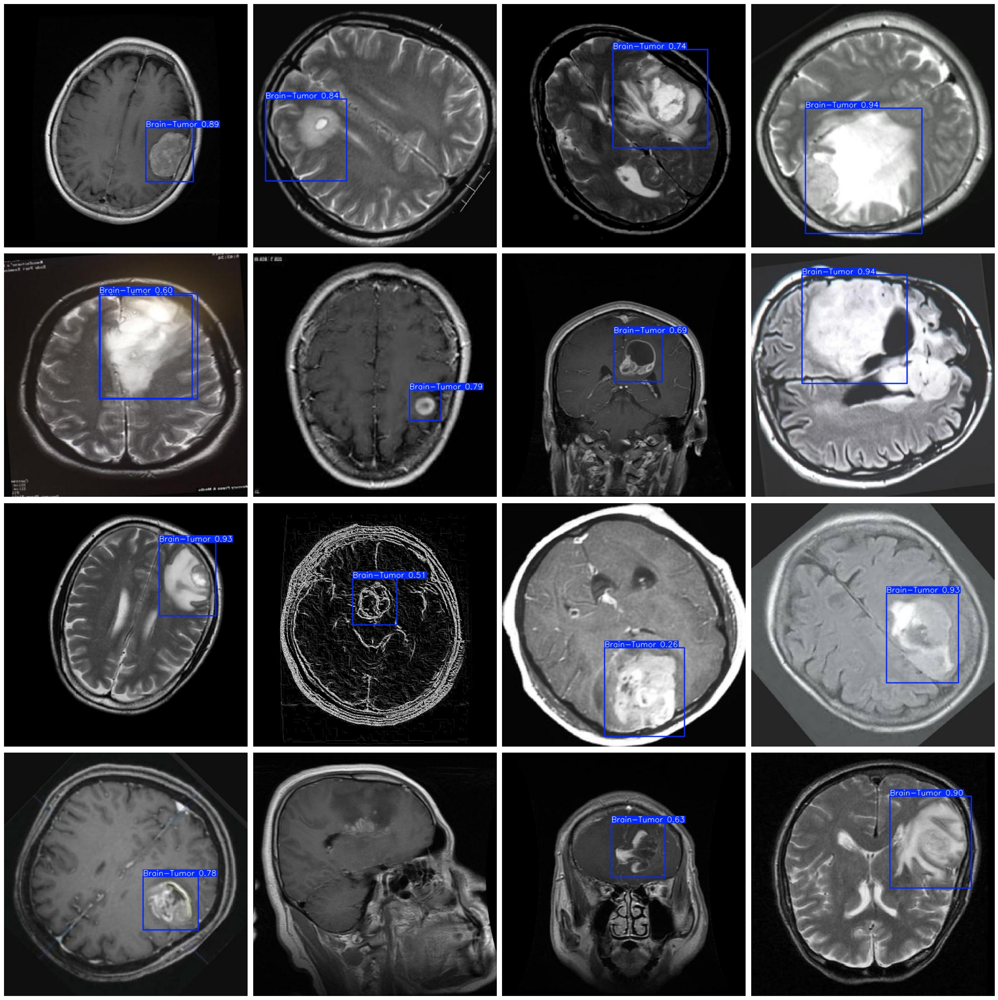

In [35]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

#find all JPEG images in the predict directory and store their paths in the list images.
images = glob.glob("/content/runs/detect/predict/*.jpg")


# Select 16 random images
images_to_display = random.sample(images, min(16, len(images)))

#display 4x4 grid with size=25x25
fig, axes = plt.subplots(4,4, figsize=(25,25))

for i, ax in enumerate(axes.flat):
  if i < len(images_to_display):
    img = mpimg.imread(images_to_display[i])
    ax.imshow(img)
    ax.axis('off')
  else:
    ax.axis('off')
plt.tight_layout()
plt.show()


image 1/1 /content/runs/detect/predict/Tr-gl_0228_jpg.rf.b9ecef834d39f770e41b0585b63bdc1a.jpg: 640x640 (no detections), 14.7ms
Speed: 2.6ms preprocess, 14.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/runs/detect/predict/Tr-gl_0968_jpg.rf.53f9af72e8ff714048e478fffae73d02.jpg: 640x640 1 Brain-Tumor, 9.9ms
Speed: 1.9ms preprocess, 9.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/runs/detect/predict/Tr-me_0063_jpg.rf.999593bab20a506c6c2b3a64562cd278.jpg: 640x640 1 Brain-Tumor, 10.0ms
Speed: 1.8ms preprocess, 10.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/runs/detect/predict/y255_jpg.rf.507bc3a080c45b76e118dc64444b0660.jpg: 640x640 (no detections), 10.1ms
Speed: 1.8ms preprocess, 10.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/runs/detect/predict/Tr-gl_0630_jpg.rf.bbabf16117b7ad237a23a52a963fcc05.jpg: 640x640 1 Brain-

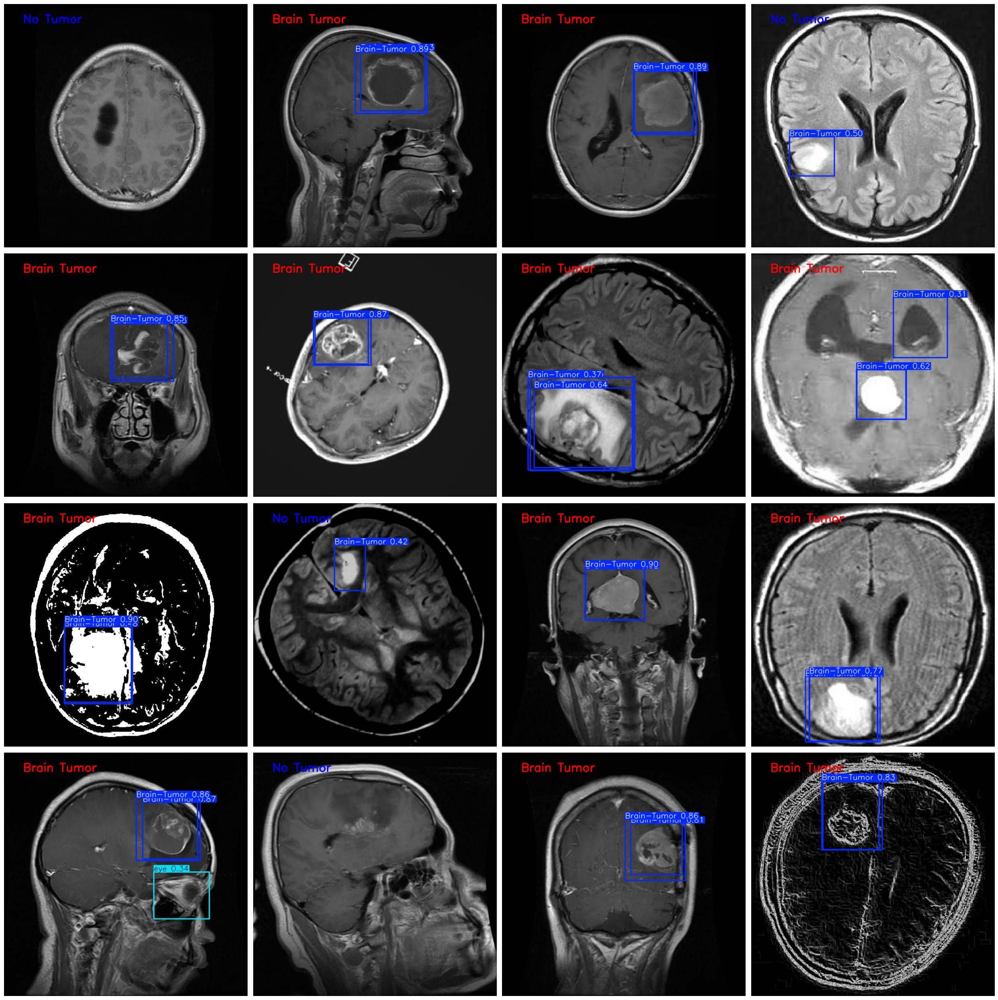

In [37]:
#Alternate code
import glob
import matplotlib.pyplot as plt
import random
import cv2

# Find all JPEG images in the predict directory and store their paths in the list 'images'
images = glob.glob("/content/runs/detect/predict/*.jpg")

# Select 16 random images
images_to_display = random.sample(images, min(16, len(images)))

# Create a 4x4 grid with overall figure size of 25x25 inches
fig, axes = plt.subplots(4, 4, figsize=(25, 25))

for i, ax in enumerate(axes.flat):
    if i < len(images_to_display):
        image_path = images_to_display[i]
        # Run inference on the image using the YOLO model
        result = model.predict(source=image_path, imgsz=640, conf=0.40)

        # Check if any bounding boxes (detections) were found
        if len(result[0].boxes) == 0:
            # No tumor detected: read the image and annotate with "No Tumor" in blue.
            annotated_img = cv2.imread(image_path)
            cv2.putText(annotated_img, "No Tumor", (50, 50), cv2.FONT_HERSHEY_SIMPLEX,
                        1, (255, 0, 0), 2, cv2.LINE_AA)  # Blue (BGR: 255,0,0)
        else:
            # Tumor detected: get the model's annotated image and add "Brain Tumor" in red.
            annotated_img = result[0].plot()
            cv2.putText(annotated_img, "Brain Tumor", (50, 50), cv2.FONT_HERSHEY_SIMPLEX,
                        1, (0, 0, 255), 2, cv2.LINE_AA)  # Red (BGR: 0,0,255)

        # Convert from BGR to RGB for correct display in matplotlib
        annotated_img = annotated_img[:, :, ::-1]
        ax.imshow(annotated_img)
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()



image 1/1 /content/runs/detect/predict/prewitt_y74_jpg.rf.18f3736fa179ba500c5573ab5861051e.jpg: 640x640 1 Brain-Tumor, 12.5ms
Speed: 2.1ms preprocess, 12.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


array([[[ 14,  14,  14],
        [  1,   1,   1],
        [  2,   2,   2],
        ...,
        [158, 158, 158],
        [139, 139, 139],
        [  0,   0,   0]],

       [[ 82,  82,  82],
        [ 71,  71,  71],
        [ 11,  11,  11],
        ...,
        [141, 141, 141],
        [217, 217, 217],
        [201, 201, 201]],

       [[123, 123, 123],
        [204, 204, 204],
        [ 13,  13,  13],
        ...,
        [215, 215, 215],
        [193, 193, 193],
        [191, 191, 191]],

       ...,

       [[  3,   3,   3],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [197, 197, 197],
        [211, 211, 211],
        [  0,   0,   0]],

       [[  5,   5,   5],
        [  7,   7,   7],
        [  0,   0,   0],
        ...,
        [212, 212, 212],
        [120, 120, 120],
        [ 17,  17,  17]],

       [[  0,   0,   0],
        [  5,   5,   5],
        [  0,   0,   0],
        ...,
        [141, 141, 141],
        [202, 202, 202],
        [  0,   0,   0]]], dtype=uint8)
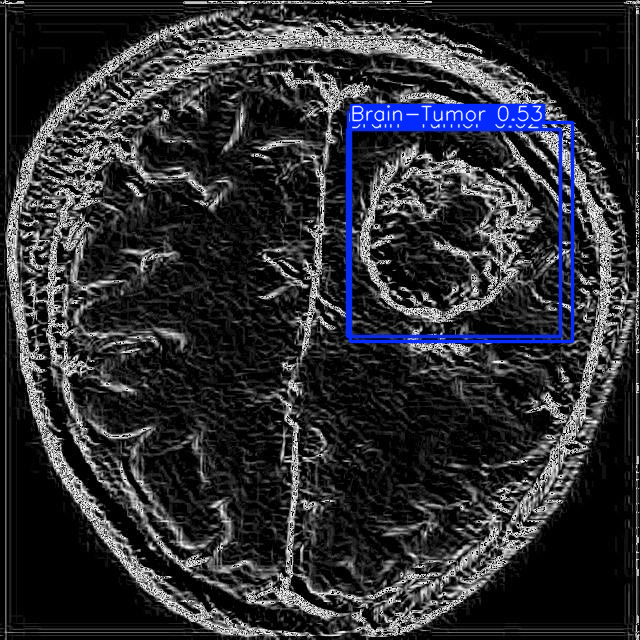

In [32]:
#select a random picture for inference. Image size = 640 pxl and confidence 40% or above
selected_image = random.choice(images)
result = model.predict(source = selected_image, imgsz = 640, conf = 0.40)

#This operation reverses the order of the color channels in the image array. Many image libraries (like OpenCV) use BGR order,
#while libraries like Matplotlib expect RGB order.
#This slice (::-1) flips the channels to ensure that colors display correctly when the image is shown.
annotated_img = result[0].plot()
annotated_img[:, :, ::-1]


image 1/1 /content/runs/detect/predict/k089_JPG_jpg.rf.eb0303e80ef9bbd6f690b409448a2f29.jpg: 640x640 1 Brain-Tumor, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


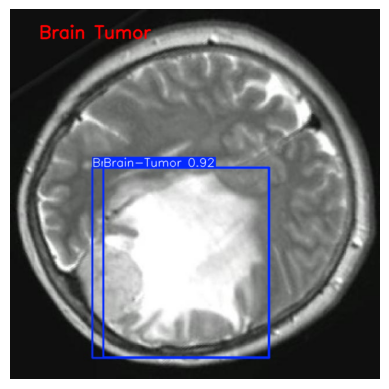

In [49]:
import random
import cv2
import matplotlib.pyplot as plt

# Select one random image
selected_image = random.choice(images)

# Run inference with the YOLO model
result = model.predict(source=selected_image, imgsz=640, conf=0.40)

# Assume result[0] contains the predictions
# Check if there are any bounding boxes detected.
if len(result[0].boxes) == 0:
    # No detections, so read the image and annotate with "No Tumor"
    annotated_img = cv2.imread(selected_image)
    # Put the "No Tumor" text on the image (adjust position, font, and color as needed)
    cv2.putText(annotated_img, "No Tumor", (50, 50), cv2.FONT_HERSHEY_SIMPLEX,
                1, (255, 0, 0), 2, cv2.LINE_AA)
else:
    # Otherwise, use the model's built-in plot method to get the annotated image
    annotated_img = result[0].plot()
    cv2.putText(annotated_img, "Brain Tumor", (50, 50), cv2.FONT_HERSHEY_SIMPLEX,
                        1, (0, 0, 255), 2, cv2.LINE_AA)  # Red (BGR: 0,0,255)

# If needed, convert BGR to RGB (OpenCV reads images in BGR format)
annotated_img = annotated_img[:, :, ::-1]

# Display the result
plt.imshow(annotated_img)
plt.axis('off')
plt.show()


**Create a Gradio app to run the model on user images**

In [50]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.4/11.4 MB 80.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 5.6 MB/s eta 0:00:00


In [53]:
import gradio as gr
import cv2
import numpy as np

def predict(image):
  result = model.predict(source=image, imgsz = 640, conf = 0.25)
  annotated_img = result[0].plot()
  annotated_img = annotated_img[:, :, ::-1]
  return annotated_img

app = gr.Interface(
    fn =predict,
    inputs = gr.Image(type="numpy", label="Upload an image"),
    outputs = gr.Image(type="numpy", label="Detect any Tumor"),
    title = "Brain Tumor Detection Using Yolov10",
    description="Upload an image and the yolov10 model will detect and annotate any brain tumor"
)

app.launch()

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://7a58f2278f12f740d5.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


**Un-mount the google drive**

In [ ]:
drive.flush_and_unmount()